# Решающие деревья. Домашнее задание

## Что нужно сделать
#### Решите задачу классификации оттоковых клиентов телекома: для каждого клиента необходимо определить, перестанет он пользоваться услугами оператора в ближайшее время или нет.

In [516]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import io
from pathlib import Path
import math
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import plot_tree


In [517]:
# Сгруппируем основную информацию о датасете и выгрузим в excel.
# import io
def unload_dataset_info(df:pd.DataFrame, dataset_file_name:str)->pd.DataFrame:
    info_filename = f'./{Path(dataset_file_name).stem}_info.xlsx'
    buf = io.StringIO()
    df.info(buf=buf)
    s = buf.getvalue()
    columns = s.splitlines()[3].split()
    lines =   [line.split() for line in s.splitlines()[5:-2]]
    lines = [[' '.join(row[1:-3]), row[-3], row[-2], row[-1]   ] for row in lines]
    df_info = pd.merge(
        pd.DataFrame(lines, columns=columns[1:])
        , df.nunique().to_frame(name='Nu'), 
        left_on='Column', 
        right_index=True)# .set_index(['#']).reset_index()
    df_vc = pd.DataFrame([[col, sorted(df[col].value_counts().to_dict().items(), key=lambda x: x[0])] for col in df.columns if len(df[col].value_counts()) < 21], columns=['Column', 'vc'])
    df_info = pd.merge(df_info, df_vc, how='left', on='Column')
    df_info = pd.merge(df_info, df.describe().T, how='left', left_on='Column', right_index=True)
    df_info = df_info[['Column', 'Non-Null']].copy()\
        .join(pd.DataFrame(df.isna().sum()).rename(columns={0: 'Null_cnt'}), how='left', on='Column')\
        .join(pd.DataFrame(df.isna().sum() / df.shape[0]).round(3).rename(columns={0: 'Null_percent'}), how='left', on='Column')\
        .join(df_info.set_index('Column').drop(columns=['Non-Null', 'Count'] ), how='left', on='Column')
    if not Path(info_filename).exists():
        df_info.to_excel(info_filename, index=False)
    return df_info

In [518]:
def rm_item_from_list(item:any, lst:list)->list:
    result = lst[:]
    if isinstance(item, list):
        item_list = item[:]
    else:
        item_list = []
        item_list.append(item)
    for el in item_list:
        try:
            result.remove(el)
        except ValueError:
            next
    return result


In [519]:
dataset_flename = "./telecom_churn.csv" 
df = pd.read_csv(dataset_flename)
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


#### Сделайте первичную обработку данных:

1. Выбросите колонку State.

2. Колонки International plan и Voice mail plan закодируйте следующим образом: Yes замените на 1, а No на 0.

3. Переведите целевую переменную (Churn) в числа: True в 1, а False в 0.

In [520]:
if 'State' in df.columns:
    df.drop(columns=['State'], inplace=True)
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [521]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Area code               3333 non-null   int64  
 2   International plan      3333 non-null   object 
 3   Voice mail plan         3333 non-null   object 
 4   Number vmail messages   3333 non-null   int64  
 5   Total day minutes       3333 non-null   float64
 6   Total day calls         3333 non-null   int64  
 7   Total day charge        3333 non-null   float64
 8   Total eve minutes       3333 non-null   float64
 9   Total eve calls         3333 non-null   int64  
 10  Total eve charge        3333 non-null   float64
 11  Total night minutes     3333 non-null   float64
 12  Total night calls       3333 non-null   int64  
 13  Total night charge      3333 non-null   float64
 14  Total intl minutes      3333 non-null   

In [522]:
df['Voice mail plan'] = df['Voice mail plan'].map({'Yes':1, 'No':0})
df['International plan'] = df['International plan'].map({'Yes':1, 'No':0})#.value_counts()
df['Churn'] = df['Churn'].map({True:1, False:0})

Выведите на экран первые строки изменённой таблицы, чтобы проверить, что все преобразования сработали.

In [523]:
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [524]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Area code               3333 non-null   int64  
 2   International plan      3333 non-null   int64  
 3   Voice mail plan         3333 non-null   int64  
 4   Number vmail messages   3333 non-null   int64  
 5   Total day minutes       3333 non-null   float64
 6   Total day calls         3333 non-null   int64  
 7   Total day charge        3333 non-null   float64
 8   Total eve minutes       3333 non-null   float64
 9   Total eve calls         3333 non-null   int64  
 10  Total eve charge        3333 non-null   float64
 11  Total night minutes     3333 non-null   float64
 12  Total night calls       3333 non-null   int64  
 13  Total night charge      3333 non-null   float64
 14  Total intl minutes      3333 non-null   

#### Создайте матрицу объект-признак X и вектор с целевой переменной (Churn) y.

In [525]:
# Это сделаем позже, после проведения EDA
# target_feature = 'Churn'
# X = df.drop(columns=target_feature)
# y = df[target_feature] 
# X.shape, y.shape

#### Проверьте баланс классов. Является ли выборка сбалансированной?

In [526]:
y.value_counts()

# Датасет не является сбалансированным с т.з. целевой переменной.

Churn
0    2850
1     483
Name: count, dtype: int64

In [527]:
display(unload_dataset_info(df, dataset_flename))

,Column,Non-Null,Null_cnt,Null_percent,Dtype,Nu,vc,count,mean,std,min,25%,50%,75%,max
0,Account length,3333,0,0.0,int64,212,NaN,3333.0,101.064806,39.822106,1.00,74.00,101.00,127.00,243.00
1,Area code,3333,0,0.0,int64,3,"[(408, 838), (415, 1655), (510, 840)]",3333.0,437.182418,42.371290,408.00,408.00,415.00,510.00,510.00
2,International plan,3333,0,0.0,int64,2,"[(0, 3010), (1, 323)]",3333.0,0.096910,0.295879,0.00,0.00,0.00,0.00,1.00
3,Voice mail plan,3333,0,0.0,int64,2,"[(0, 2411), (1, 922)]",3333.0,0.276628,0.447398,0.00,0.00,0.00,1.00,1.00
4,Number vmail messages,3333,0,0.0,int64,46,NaN,3333.0,8.099010,13.688365,0.00,0.00,0.00,20.00,51.00
5,Total day minutes,3333,0,0.0,float64,1667,NaN,3333.0,179.775098,54.467389,0.00,143.70,179.40,216.40,350.80
6,Total day calls,3333,0,0.0,int64,119,NaN,3333.0,100.435644,20.069084,0.00,87.00,101.00,114.00,165.00
7,Total day charge,3333,0,0.0,float64,1667,NaN,3333.0,30.562307,9.259435,0.00,24.43,30.50,36.79,59.64
8,Total eve minutes,3333,0,0.0,float64,1611,NaN,3333.0,200.980348,50.713844,0.00,166.60,201.40,235.30,363.70
9,Total eve calls,3333,0,0.0,int64,123,NaN,3333.0,100.114311,19.922625,0.00,87.00,100.00,114.00,170.00


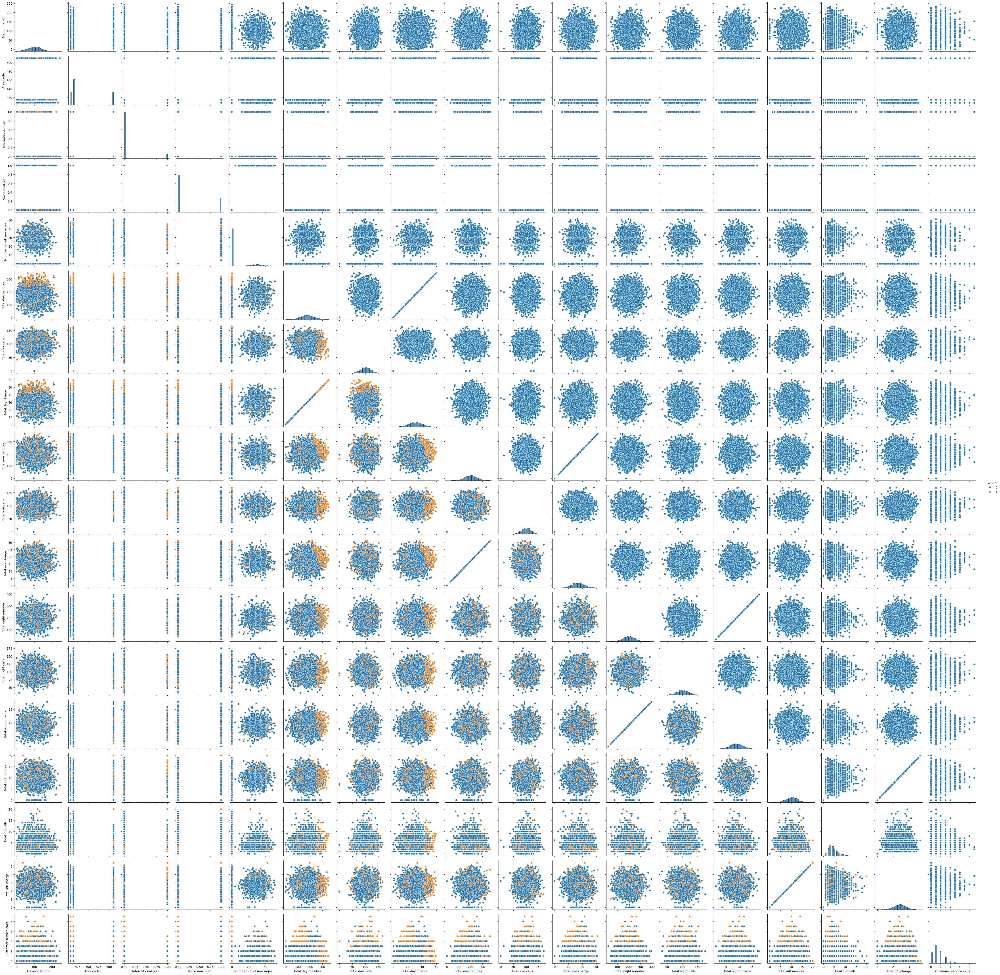

In [528]:
g1 = sns.PairGrid(df, height = 2.5, hue=target_feature)
g1.map_diag(sns.histplot, bins=30, hue=None)
g1.map_lower(sns.scatterplot)
g1.map_upper(sns.scatterplot, hue=None)
g1.add_legend();

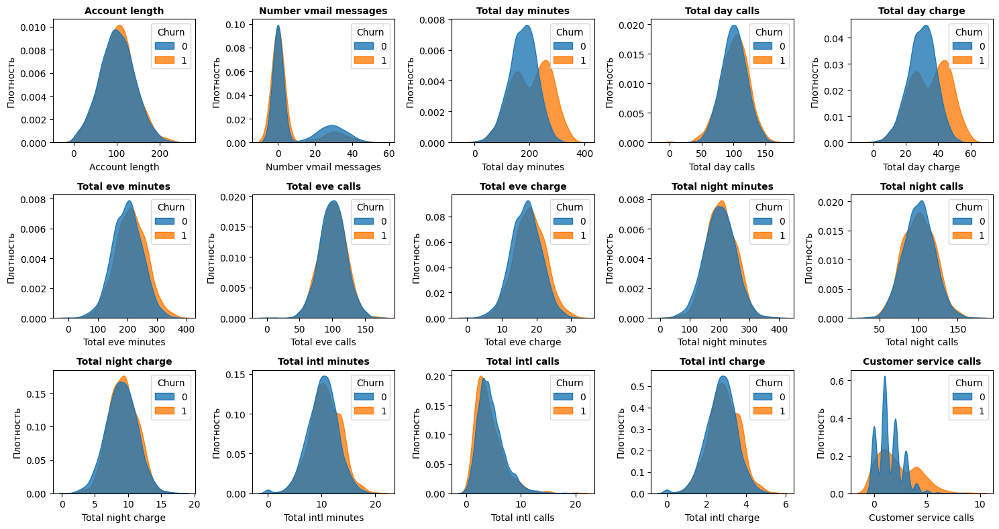

In [529]:
number_features = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge',
                    'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']
pic_from_line = 5
pic_from_col = math.ceil(len(number_features) / pic_from_line)

fig, axes = plt.subplots(pic_from_col, pic_from_line, figsize = (15,8))
# Расстояние между графиками
# plt.subplots_adjust(hspace=0.5)

columns = df[number_features].columns

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // pic_from_line, i % pic_from_line]
    sns.kdeplot(data = df[number_features], x = column, fill = True, alpha = 0.8, hue = df['Churn'], ax = ax , common_norm=False)
    ax.set_title(column, fontweight = 'bold', fontsize = 10)
    ax.set_xlabel(column, fontsize = 10)
    ax.set_ylabel('Плотность', fontsize = 10)

plt.tight_layout()
plt.show()


Наблюдаем ситуацию, когда:
 - 'Total day minutes', 'Total day charge' показывают возможность разделения по целевой переменной;
 - остальные признаки по отдельности в парных комибинациях не показывают возможность линейной разделимости;
 - есть признаки признаки 'Total day minutes', 'Total day calls' линейно зависимы. Следствие - целесообразно исключить один из них или сделать их комбинацию (например умножить)

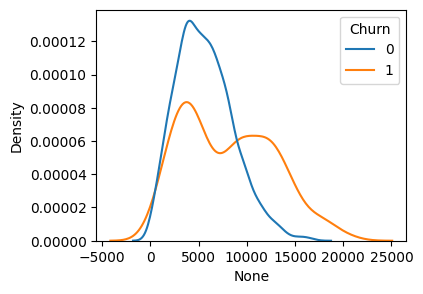

In [530]:
# Посмотрим, что дает умножение
plt.figure(figsize=(4, 3))
# sns.kdeplot(x=df.apply(lambda x: np.log(x['Total day minutes'] * x['Total day charge'] * x['Customer service calls']), axis=1), hue=df['Churn'], common_norm=False);
sns.kdeplot(x=df.apply(lambda x: x['Total day minutes'] * x['Total day charge'], axis=1), hue=df['Churn'], common_norm=False);

Умножение сохранило формат графиков

In [531]:
# Добавим новый признак
df['Total day minutes_charge'] = df.apply(lambda x: (x['Total day minutes'] * x['Total day charge']), axis=1)
# Обозначим один из коррелирующих между собой признаки для последующего удаления.
corr_features = ['Total day minutes', 'Total day charge','Total night charge', 'Total eve charge', 'Total intl charge']
df[rm_item_from_list(corr_features, df.columns.to_list())].columns

Index(['Account length', 'Area code', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day calls', 'Total eve minutes',
       'Total eve calls', 'Total night minutes', 'Total night calls',
       'Total intl minutes', 'Total intl calls', 'Customer service calls',
       'Churn', 'Total day minutes_charge'],
      dtype='object')

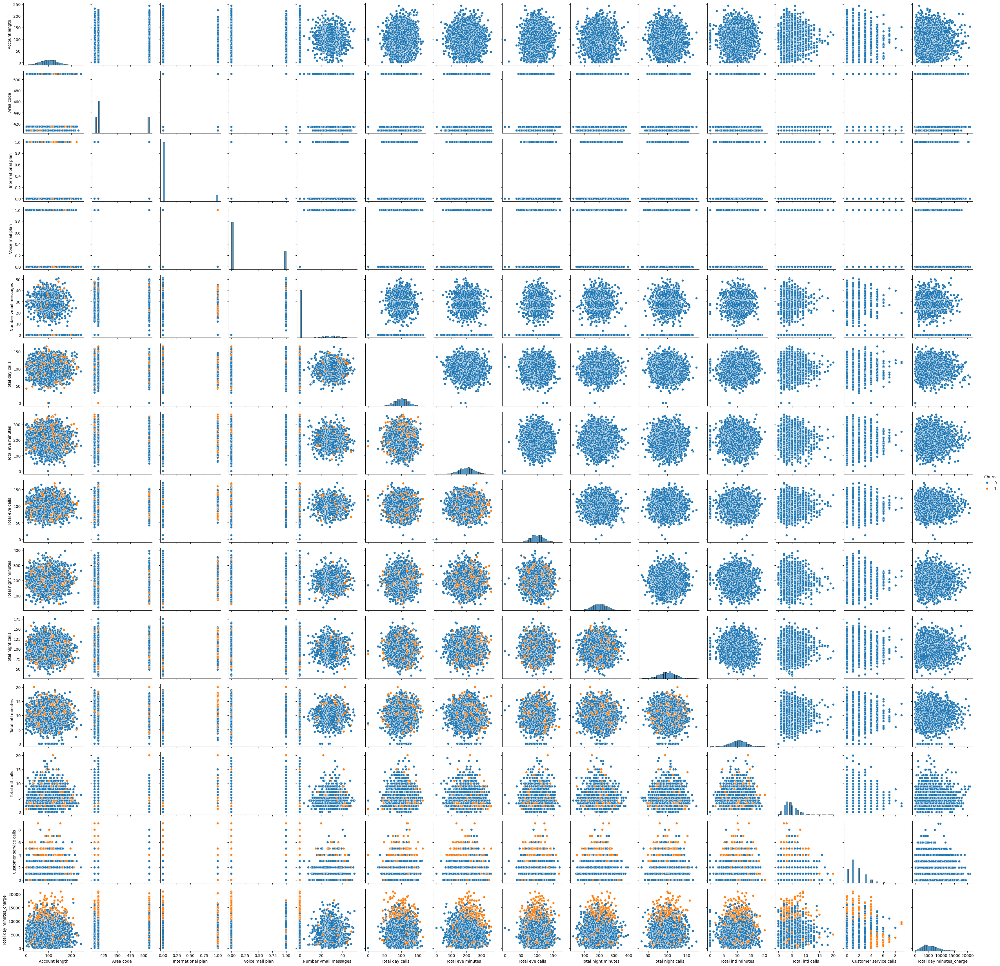

In [555]:
g1 = sns.PairGrid(df[rm_item_from_list(corr_features, df.columns.to_list())], height = 2.5, hue=target_feature)
g1.map_diag(sns.histplot, bins=30, hue=None)
g1.map_lower(sns.scatterplot)
g1.map_upper(sns.scatterplot, hue=None)
g1.add_legend();

#### Разбейте данные на тренировочную и тестовую части, размер тестовой части — 30%.

In [533]:
from sklearn.model_selection import train_test_split

In [534]:
target_feature = 'Churn'
X = df[rm_item_from_list(corr_features, df.columns.to_list())].drop(columns=target_feature)
y = df[target_feature] 
X.shape, y.shape
X_train, X_test, y_train, y_test = train_test_split(X, y\
                                                    , train_size=0.7\
                                                    , random_state=42
                                                    , stratify=y)
print(f'{[el.shape for el in [X_train, X_test, y_train, y_test]]}')

[(2333, 14), (1000, 14), (2333,), (1000,)]


Для линейных моделей очень важно масштабирование признаков. Поэтому отмасштабируйте признаки при помощи [StandardScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html), обучив метод на тренировочных данных и применив его и к трейну, и к тесту.

In [535]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [536]:
scaler.fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X.columns)

In [537]:
X.describe()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Customer service calls,Total day minutes_charge
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,0.096910,0.276628,8.099010,100.435644,200.980348,100.114311,200.872037,100.107711,10.237294,4.479448,1.562856,5998.527648
std,39.822106,42.371290,0.295879,0.447398,13.688365,20.069084,50.713844,19.922625,50.573847,19.568609,2.791840,2.461214,1.315491,3389.610975
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,0.000000,0.000000,87.000000,166.600000,87.000000,167.000000,87.000000,8.500000,3.000000,1.000000,3510.591000
50%,101.000000,415.000000,0.000000,0.000000,0.000000,101.000000,201.400000,100.000000,201.200000,100.000000,10.300000,4.000000,1.000000,5471.700000
75%,127.000000,510.000000,0.000000,1.000000,20.000000,114.000000,235.300000,114.000000,235.300000,113.000000,12.100000,6.000000,2.000000,7961.356000
max,243.000000,510.000000,1.000000,1.000000,51.000000,165.000000,363.700000,170.000000,395.000000,175.000000,20.000000,20.000000,9.000000,20921.712000


#### После масштабирования признаков X_train и X_test перестали быть объектами типа pd.DataFrame, это неудобно. Приведите их снова к pd.DataFrame.

In [538]:
# Сделано выше

#### Обучите на тренировочных данных с параметрами по умолчанию:

1) логистическую регрессию;

2) метод опорных векторов (с kernel='linear').

In [539]:
model_lr = LogisticRegression()
model_svc = SVC(kernel='linear')

In [540]:
model_lr.fit(X_train_scaled, y_train)
model_svc.fit(X_train_scaled, y_train)

SVC(kernel='linear')

#### С помощью обученных моделей сделайте предсказание на тестовых данных.

In [541]:
y_test_pred_lr = model_lr.predict(X_test)
y_test_pred_svc = model_svc.predict(X_test)

In [542]:
# Т.к. имеется дисбаланс классов в целевой переменной 
from sklearn.metrics import roc_auc_score


In [543]:
print(f'roc_auc logistic_regresson : {roc_auc_score(y_test, y_test_pred_lr)}')
print(f'roc_auc SVC classifier : {roc_auc_score(y_test, y_test_pred_svc)}')

roc_auc logistic_regresson : 0.5
roc_auc SVC classifier : 0.5545069570477918


Модель без конструирования признаков результаты чуть хуже, чем после работы с признаками (добавление нового и удаления коррелирующих).
Результаты работы без конструирования признаков\
Не стал ее здесь приводить, т.к. будет просто много кода.

roc_auc logistic_regresson : 0.5\
roc_auc SVC classifier : 0.5

### Теперь обучите решающее дерево с параметрами по умолчанию на тренировочных данных, сделайте предсказание на тесте. Используйте метрику для оценки.

In [544]:
from sklearn.tree import DecisionTreeClassifier
model_dtc = DecisionTreeClassifier()

Нужно ли масшабировать признаки для обучения решающего дерева? Проверьте это, заново разбив данные на тренировочную и тестовую части (назовите новые полученные объекты новыми названиями), и проведите обучение, предсказание и оценку метрики до масштабирования и после.

In [545]:
# Обучим модель на немасштабированных данных
# Выполним предсказания на тренировочном и тестовом датасете
model_dtc.fit(X_train, y_train)
y_train_pred_dtc_noscale = model_dtc.predict(X_train)
y_test_pred_dtc_noscale = model_dtc.predict(X_test)

In [546]:
model_dtc.fit(X_train_scaled, y_train)
y_train_pred_dtc_scale = model_dtc.predict(X_train_scaled)
y_test_pred_dtc_scale = model_dtc.predict(X_test_scaled)

In [547]:
print(f'roc_auc decision tree train no scale : {roc_auc_score(y_train, y_train_pred_dtc_noscale)}')
print(f'roc_auc decision tree test  no scale : {roc_auc_score(y_test, y_test_pred_dtc_noscale)}')
print(f'roc_auc decision tree train scale    : {roc_auc_score(y_train, y_train_pred_dtc_scale)}')
print(f'roc_auc decision tree test  scale    : {roc_auc_score(y_test, y_test_pred_dtc_scale)}')

roc_auc decision tree train no scale : 1.0
roc_auc decision tree test  no scale : 0.8104456543657995
roc_auc decision tree train scale    : 1.0
roc_auc decision tree test  scale    : 0.8156483161927809


Модель без конструирования признаков результаты чуть хуже, чем после работы с признаками (добавление нового и удаления коррелирующих).
Результаты работы без конструирования признаков\
Не стал ее здесь приводить, т.к. будет просто много кода.

roc_auc decision tree train no scale : 1.0\
roc_auc decision tree test  no scale : 0.8082274652147611\
roc_auc decision tree train scale    : 1.0\
roc_auc decision tree test  scale    : 0.8029643073200243


#### Какая модель справилась с решением задачи?

Выводы:\
Видим, что модель на основе алгоритма решающего дерева с гиперпараметрами по умолчанию имеет самую высокую метрику.
Для алгоритма решающего дерева масштабирования признаков не требуется. 
Т.к. в задачах классификации, в частности, алгоритм при решении задачи разделения выборки не имеет значение количественное значение 
признака, а имеет значение состав объектов попавших в выборку до разделения.\

Так же наблюдаем ситуацию переобучения с гиперпараметрами по умолчанию.


####  Попробуем улучшить результаты работы модели

In [548]:
# Оценим важность признаков, удалим самые малозначимые.
feature_importances = pd.Series(model_dtc.feature_importances_, index=X_train.columns)
feature_importances.sort_values(ascending=False)

Total day minutes_charge    0.262413
Total eve minutes           0.136750
Total intl minutes          0.118486
Customer service calls      0.117310
International plan          0.072137
Total intl calls            0.065508
Number vmail messages       0.060479
Total night minutes         0.041109
Total day calls             0.031999
Total eve calls             0.029503
Account length              0.025125
Total night calls           0.022805
Voice mail plan             0.014645
Area code                   0.001730
dtype: float64

In [549]:
low_importance_fetures = ['Total day calls', 'Total eve calls', 'Total night calls', 'Number vmail messages', 'Account length', 'Area code']
X_wo_low_importance_fetures_train = X_train.loc[ : , rm_item_from_list(low_importance_fetures, X.columns.to_list())]
X_wo_low_importance_fetures_test = X_test.loc[ : , rm_item_from_list(low_importance_fetures, X.columns.to_list())]

In [550]:
model_dtc_low_importance_fetures = DecisionTreeClassifier()
model_dtc_low_importance_fetures.fit(X_wo_low_importance_fetures_train, y_train)
print(f'roc_auc decision tree test  scale    : {roc_auc_score(y_test, model_dtc_low_importance_fetures.predict(X_wo_low_importance_fetures_test))}')

roc_auc decision tree test  scale    : 0.8399677354305303


Наблюдаем, что при исключении малозначимых признаков, качество модели улучшилось.

#### Визуализация дерева решений

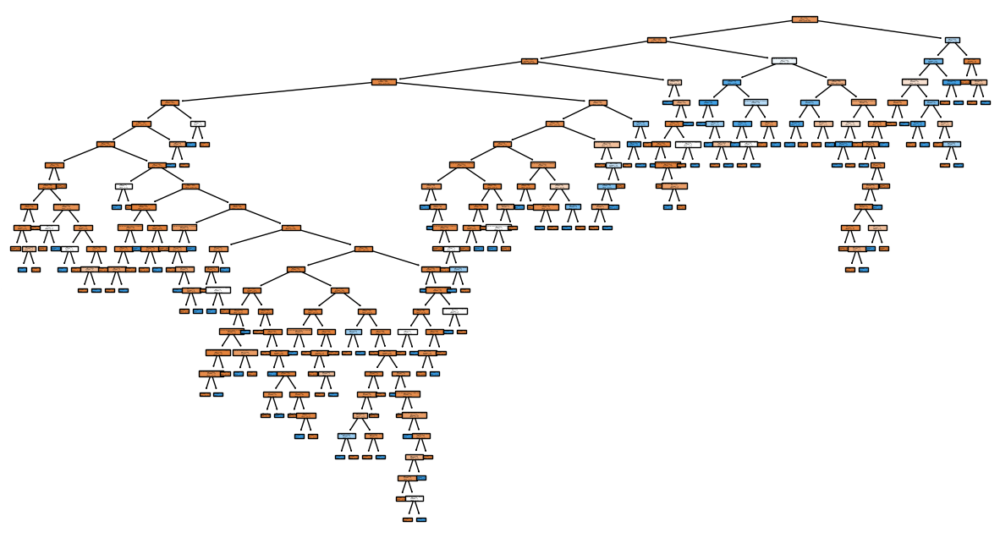

In [551]:
plt.figure(figsize=(15, 8))
plot_tree(model_dtc_low_importance_fetures, feature_names=X_wo_low_importance_fetures_test.columns, filled=True)
plt.show()

In [552]:
ccp_alphas.max()

0.02859915827002163

In [553]:
# Попробуем провести прунинг дерева решений по технлогии преложенной здесь:
# https://www.geeksforgeeks.org/pruning-decision-trees
path = model_dtc_low_importance_fetures.cost_complexity_pruning_path(X_wo_low_importance_fetures_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
ccp_alphas, impurities

pruned_models = []
for ccp_alpha in ccp_alphas:
    pruned_model = DecisionTreeClassifier(ccp_alpha=ccp_alpha)
    pruned_model.fit(X_wo_low_importance_fetures_train, y_train)
    pruned_models.append(pruned_model)

# Find the model with the best accuracy on test data
train_metrics, test_metrics = [], []
best_roc_auc = 0
best_pruned_model = None
for pruned_model in pruned_models:
    roc_auc_train = roc_auc_score(y_train, pruned_model.predict(X_wo_low_importance_fetures_train))
    roc_auc_test = roc_auc_score(y_test, pruned_model.predict(X_wo_low_importance_fetures_test))
    train_metrics.append(roc_auc_train)
    test_metrics.append(roc_auc_test)
    # print(roc_auc)
    if roc_auc_test > best_roc_auc:
        best_roc_auc = roc_auc_test
        best_pruned_model = pruned_model
# Model roc_auc after pruning
roc_auc_after_pruning = roc_auc_score(y_test, best_pruned_model.predict(X_wo_low_importance_fetures_test))
print("roc_auc after pruning:", roc_auc_after_pruning)


roc_auc after pruning: 0.8492034684412179


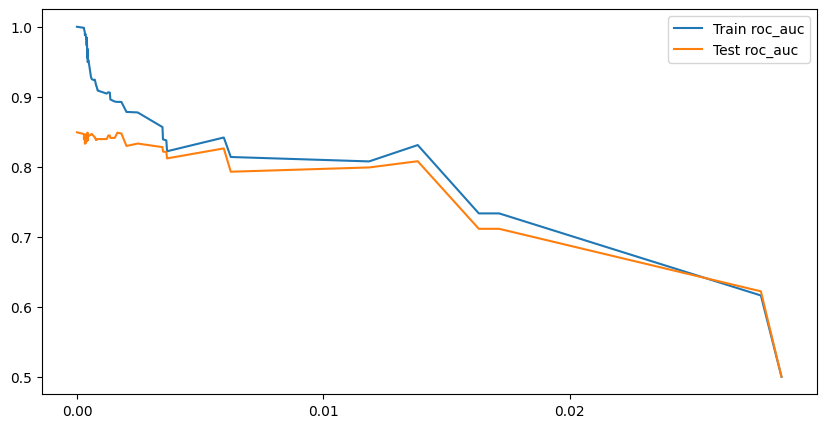

In [554]:
plt.figure(figsize=(10, 5))
sns.lineplot(y=train_metrics, x=ccp_alphas, label='Train roc_auc')
sns.lineplot(y=test_metrics, x=ccp_alphas, label='Test roc_auc')
plt.xticks(ticks=np.arange(ccp_alphas.min(), ccp_alphas.max(), 0.01))
plt.show()

Получилось еще немного улучшить метрику модели на отложенной выборке